In [33]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

In [66]:
# set parameters here
PATH = 'Rainier'                                                         # image_path
DEFAULT_MEDIUM_MEGAPIX = 0.6                                             # resize scale
DEFAULT_LOW_MEGAPIX = 0.3
DEFAULT_FINAL_MEGAPIX = 1
DETECTOR_NAME = 'sift'                                                   # can be sift/brisk/akaze/orb
CONFIDENCE_THRESH = 1                                                    # matching confidence threshold, which is used to classify images
DEFAULTE_WARPER_TYPE = 'spherical'                                       # how to do image warping
DEFAULT_BLENDER = "feather"                                              # blending
DEFAULT_BLEND_STRENGTH = 5                                               # blending
DEFAULT_SEAM_FINDER_IDX = 0                                              # seam finder idx, can be 0,1,2,3
DEFAULT_COMPENSATOR_IDX = 0                                              # exposure compensation
DEFAULT_NR_FEEDS = 1                                                     # exposure compensation
DEFAULT_BLOCK_SIZE = 32                                                  # exposure compensation

In [35]:
def StitchingError(Exception):
    pass

In [36]:
class ImageHandler:
    '''
    this class is used to handle images.
    - read images
    - get images sizes
    - do plotting
    '''
    def __init__(self):
        pass

    def read_images(self, path):
        if os.path.isdir(path):
            imageNames = os.listdir(path)
            print('[INFO] found {} images'.format(len(imageNames)))
            for i in range(len(imageNames)):
                imageNames[i] = path + '/' + imageNames[i]
        else:
            print('[INFO] Invalid image path')
        return imageNames

    def read_image_arrays(self, imageNames):
        images = []
        for i in range(len(imageNames)):
            img = cv2.imread(imageNames[i])
            images.append(img)
        return images

    def get_sizes(self, imgs):
        return [(img.shape[1], img.shape[0]) for img in imgs]

    def plot_image(self, img, figsize_in_inches=(5,5)):
        fig, ax = plt.subplots(figsize=figsize_in_inches)
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()
    
    def plot_images(self, imgs, figsize_in_inches=(20,20)):
        fig, axs = plt.subplots(1, len(imgs), figsize=figsize_in_inches)
        for col, img in enumerate(imgs):
            axs[col].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            axs[col].axis('off')
        plt.tight_layout()
        plt.show()

    def describe(self, low, med, final) -> None:
        self.plot_images(low)
        self.plot_images(med)
        self.plot_images(final)

        # some information
        medium_size = med_imgs[0].size
        low_size = low_imgs[0].size
        final_size = final_imgs[0].size

        print(f"Medium Size:   {medium_size}  -> {'{:,}'.format(np.prod(medium_size))} px ~ 0.6 MP")
        print(f"Low Size:      {low_size}   -> {'{:,}'.format(np.prod(low_size))} px ~ 0.1 MP")
        print(f"Final Size:    {final_size}  -> {'{:,}'.format(np.prod(final_size))} px ~ 1 MP")

In [37]:
ih = ImageHandler()

# this is the data path, change it                

names = ih.read_images(PATH)
imgs = ih.read_image_arrays(names)
sizes = ih.get_sizes(imgs)

[INFO] found 12 images


In [38]:
class Resizer:

    '''
    this class is used to resize images
    '''

    def __init__(
        self,
        low_megapix = DEFAULT_LOW_MEGAPIX,
        medium_megapix = DEFAULT_MEDIUM_MEGAPIX,
        final_megapix = DEFAULT_FINAL_MEGAPIX
    ):
        self.low_megapix = low_megapix
        self.medium_megapix = medium_megapix
        self.final_megapix = final_megapix

    def get_scaled_img_size(self, scale, img_size):
        width = int(round(img_size[0] * scale))
        height = int(round(img_size[1] * scale))
        return (width, height)

    def resize_img(self, size, img):
        '''
        resize one single image
        '''
        return cv2.resize(img, size, interpolation=cv2.INTER_LINEAR_EXACT)

    def resize_imgs(self, scale, images):
        imgs = []
        for i in range(len(images)):
            size = (images[i].shape[1], images[i].shape[0])
            size = self.get_scaled_img_size(scale, size)
            imgs.append(self.resize_img(size, images[i]))
        return imgs

    def get_resized_imgs(self, images:list) -> (list, list, list):
        '''
        Given the input images, output the resized low, medium and final images
        '''
        medium_imgs = self.resize_imgs(self.medium_megapix, images)
        low_imgs = self.resize_imgs(self.low_megapix, images)
        final_imgs = self.resize_imgs(self.final_megapix, images)
        return low_imgs, medium_imgs, final_imgs

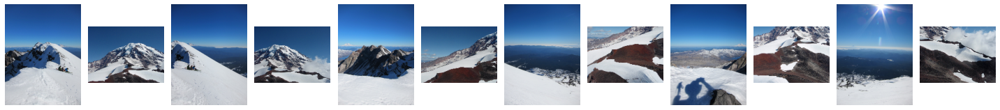

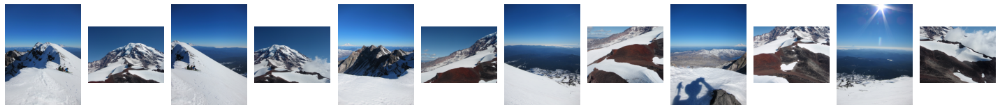

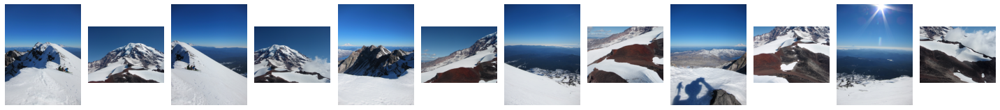

Medium Size:   944784  -> 944,784 px ~ 0.6 MP
Low Size:      236196   -> 236,196 px ~ 0.1 MP
Final Size:    2624400  -> 2,624,400 px ~ 1 MP


In [39]:
rz = Resizer()
low_imgs, med_imgs, final_imgs = rz.get_resized_imgs(imgs)
low_sizes = ih.get_sizes(low_imgs)
med_sizes = ih.get_sizes(med_imgs)
final_sizes = ih.get_sizes(final_imgs)

low_sizes, med_sizes, final_sizes
ih.describe(low_imgs, med_imgs, final_imgs)                     # this function will display information about images

In [42]:
from collections import OrderedDict

DETECTOR_CHOICES = OrderedDict()
DETECTOR_CHOICES["orb"] = cv2.ORB.create
DETECTOR_CHOICES["sift"] = cv2.SIFT_create
DETECTOR_CHOICES["brisk"] = cv2.BRISK_create
DETECTOR_CHOICES["akaze"] = cv2.AKAZE_create

class Detection:
    '''
    Feature detection
    construction, detection and plot
    '''

    def __init__(self):
        self.detector = None

    def construct(self, name = 'akaze', **kwargs):
        detector = DETECTOR_CHOICES[name](**kwargs)
        self.detector = detector
        return detector

    def detect_features(self, img, *args, **kwargs):
        return cv2.detail.computeImageFeatures2(self.detector, img, *args, **kwargs)

    def draw_keypoints(self, img, features, **kwargs):
        kwargs.setdefault("color", (0, 255, 0))                 # set the keypoint color to be green
        keypoints = features.getKeypoints()
        return cv2.drawKeypoints(img, keypoints, None, **kwargs)

    def get_all_features(self, imgs) -> list:
        '''
        get features for each image in the given dataset imgs
        '''
        return [self.detect_features(img) for img in imgs]

In [43]:
detection = Detection()
detection.construct(DETECTOR_NAME)                                                       # construct a feature detector
features = detection.detect_features(img=med_imgs[1])                                       # detect the keypoints of the second image
img_with_keypts = detection.draw_keypoints(img=med_imgs[1], features=features)              # draw the features on the image
#ih.plot_image(img=img_with_keypts) 

features = detection.get_all_features(imgs=med_imgs)                                    # use medium images to do feature detection
features

[< cv2.detail.ImageFeatures 0000024FB8FB2F60>,
 < cv2.detail.ImageFeatures 0000024FBE37EDB0>,
 < cv2.detail.ImageFeatures 0000024FBE37E660>,
 < cv2.detail.ImageFeatures 0000024FBA0F5300>,
 < cv2.detail.ImageFeatures 0000024FBA0F5150>,
 < cv2.detail.ImageFeatures 0000024FBA0F50C0>,
 < cv2.detail.ImageFeatures 0000024FBA0F5030>,
 < cv2.detail.ImageFeatures 0000024FBA0F58A0>,
 < cv2.detail.ImageFeatures 0000024FBA0F56F0>,
 < cv2.detail.ImageFeatures 0000024FBA0F59C0>,
 < cv2.detail.ImageFeatures 0000024FBA0F5810>,
 < cv2.detail.ImageFeatures 0000024FBA0F5AE0>]

In [44]:
import seaborn as sns

class Matcher:

    def __init__(self):
        self.matcher = None

    def construct(self, **kwargs):
        '''
        construct a feature matcher
        '''
        self.matcher = cv2.detail_BestOf2NearestMatcher(**kwargs)

    def match_features(self, features, *args, **kwargs):
        matches = self.matcher.apply2(features, *args, **kwargs)
        self.matcher.collectGarbage()
        return matches

    def array_in_sqare_matrix(self, array):
        '''
        transform an array to a matrix
        '''
        matrix_dimension = int(np.sqrt(len(array)))
        rows = []
        for i in range(0, len(array), matrix_dimension):
            rows.append(array[i : i + matrix_dimension])
        return np.array(rows)

    def get_matches_matrix(self, matches):
        '''
        transform the matches into a matrix
        '''
        return self.array_in_sqare_matrix(matches)

    def get_confidence_matrix(self, matches):
        '''
        calculate the confidence matrix based on the matches matrix
        '''
        matches_matrix = self.get_matches_matrix(matches)
        match_confs = [[m.confidence for m in row] for row in matches_matrix]
        match_conf_matrix = np.array(match_confs)
        return match_conf_matrix

    def get_confidence_heatmap(self, matches) -> None:
        confidence_matrix = self.get_confidence_matrix(matches)
        sns.heatmap(confidence_matrix, cmap='viridis', annot=False)

    def draw_matches_matrix(self, imgs, features, matches, conf_thresh=1, inliers=False, **kwargs):
        '''
        draw the feature matches on the given images
        '''
        matches_matrix = self.get_matches_matrix(matches)
        for idx1, idx2 in self.get_all_img_combinations(len(imgs)):
            match = matches_matrix[idx1, idx2]
            if match.confidence < conf_thresh:              # the match confidence is small, skip
                continue
            if inliers:
                kwargs["matchesMask"] = match.getInliers()
            yield idx1, idx2, self.draw_matches(imgs[idx1], features[idx1], imgs[idx2], features[idx2], match, **kwargs)

    def get_all_img_combinations(self, number_imgs):
        '''
        get all combinations of pairwise images
        '''
        ii, jj = np.triu_indices(number_imgs, k=1)
        for i, j in zip(ii, jj):
            yield i, j

    def draw_matches(self, img1, features1, img2, features2, match1to2, **kwargs):
        kwargs.setdefault("flags", cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

        keypoints1 = features1.getKeypoints()
        keypoints2 = features2.getKeypoints()
        matches = match1to2.getMatches()

        return cv2.drawMatches(
            img1, keypoints1, img2, keypoints2, matches, None, **kwargs
        )

    def get_match_info(self, imgs, features, matches, conf_thresh = 1, inliers=True):
        all_relevant_matches = self.draw_matches_matrix(imgs, features, matches, conf_thresh, inliers)
        for idx1, idx2, img in all_relevant_matches:
            print('[INFO] match image {} to image {}'.format(idx1+1, idx2+1))

    def describe(self, ih, imgs, features, matches) -> None:
        for item in self.draw_matches_matrix(imgs, features, matches):
           ih.plot_image(item[2])

144
[INFO] match image 1 to image 3
[INFO] match image 1 to image 5
[INFO] match image 2 to image 4
[INFO] match image 2 to image 6
[INFO] match image 2 to image 8
[INFO] match image 2 to image 10
[INFO] match image 2 to image 12
[INFO] match image 3 to image 7
[INFO] match image 4 to image 6
[INFO] match image 4 to image 10
[INFO] match image 4 to image 12
[INFO] match image 5 to image 9
[INFO] match image 6 to image 8
[INFO] match image 6 to image 10
[INFO] match image 7 to image 11
[INFO] match image 8 to image 10
[INFO] match image 10 to image 12


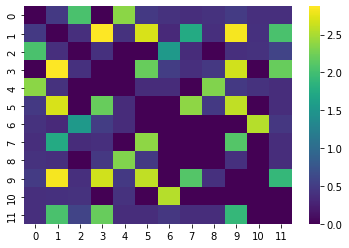

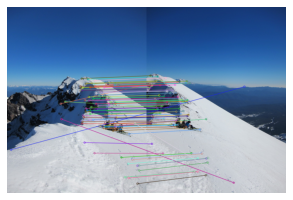

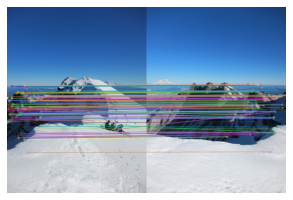

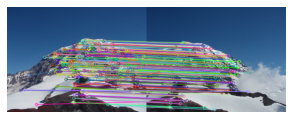

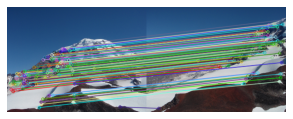

...

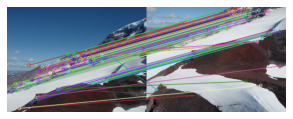

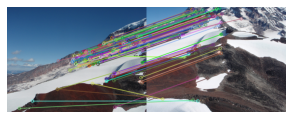

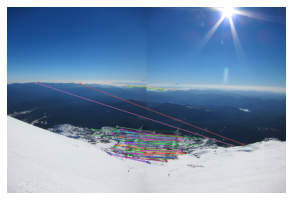

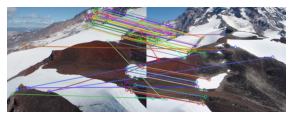

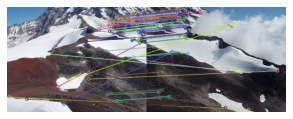

In [45]:
mc = Matcher()
mc.construct()                                          # construct a feature matcher
matches = mc.match_features(features=features)          # match the features
print(len(matches))                                     # since we have n images, the result has n**2 matches

cf_matrix = mc.get_confidence_matrix(matches=matches)   # get the confidence matrix
mc.get_confidence_heatmap(matches=matches)
mc.get_match_info(med_imgs, features=features, matches=matches)

mc.describe(ih, med_imgs, features=features, matches=matches)

In [47]:
class Classify:

    '''
    This class contains the funtions needed to classify images and remove noises    
    '''

    def is_connected(self, i, j, matrix, thresh=CONFIDENCE_THRESH):
        if matrix[i, j] > thresh:
            return True
        return False

    def find_components(self, matrix):
        components = []
        for i in range(matrix.shape[0]):
            tmp = {i}
            for j in range(matrix.shape[1]):
                if self.is_connected(i, j, matrix=matrix):
                    tmp.add(j)
            components.append(tmp)
        return components

    def merge(self, groups: list):
        out = []
        l = len(groups)
        for i in range(len(groups)):
            tmp = groups[i]
            for j in range(i, len(groups)):
                if len(tmp.intersection(groups[j])) != 0:
                    tmp = tmp.union(groups[j])
            out.append(tmp)
        return out

    def merge2(self, out):
        out = np.array(out)
        out = np.unique(out)
        out = list(out)
        tmp = []
        for i in range(len(out)):
            for j in range(i+1, len(out)):
                if out[j].issuperset(out[i]):
                    tmp.append(out[i])
                    break
        for item in tmp:
            out.remove(item)

        tmp = []
        for i in range(len(out)-1, -1, -1):
            for j in range(i-1, -1, -1):
                if out[j].issuperset(out[i]):
                    tmp.append(out[i])
                    break
        for item in tmp:
            out.remove(item)

        for i in range(len(out)):
            out[i] = list(out[i])
        return out

    def remove_noise(self, out):
        tmp = []
        for i in range(len(out)):
            if len(out[i]) == 1:
               tmp.append(out[i])
        for item in tmp:
            out.remove(item)
        return out

    def features_by_class(self, features, out):
        temp = []
        for item in out:
            tmp = []
            for i in item:
                tmp.append(features[i])
            temp.append(tmp)
        return temp

    def imgs_by_class(self, imgs, out):
        temp = []
        for item in out:
            tmp = []
            for i in item:
                tmp.append(imgs[i])
            temp.append(tmp)
        return temp

In [50]:
cs = Classify()
groups = cs.find_components(cf_matrix)
out = cs.merge(groups)
out = cs.merge2(out)
out = cs.remove_noise(out)                                      # remove the possible noise contained
features_by_group = cs.features_by_class(features, out)         # get features by groups
imgs_by_group = cs.imgs_by_class(imgs, out)                     # get images by groups
print('[INFO] number of groups detected is {}'.format(len(out)))

[INFO] number of groups detected is 2


36
[INFO] match image 1 to image 2
[INFO] match image 1 to image 3
[INFO] match image 2 to image 4
[INFO] match image 3 to image 5
[INFO] match image 4 to image 6


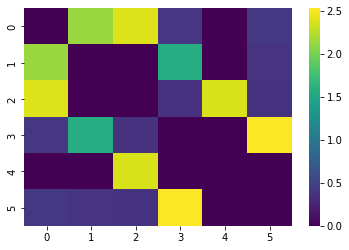

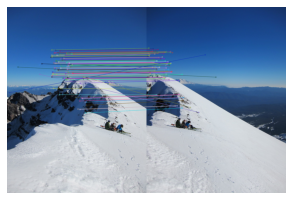

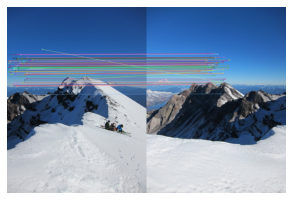

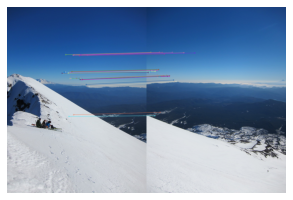

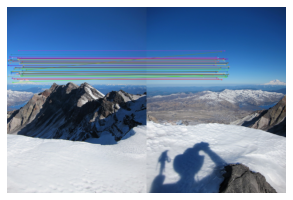

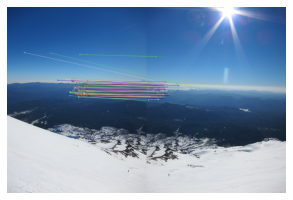

36
[INFO] match image 1 to image 2
[INFO] match image 1 to image 3
[INFO] match image 1 to image 4
[INFO] match image 1 to image 5
[INFO] match image 1 to image 6
[INFO] match image 2 to image 3
[INFO] match image 2 to image 5
[INFO] match image 2 to image 6
[INFO] match image 3 to image 4
[INFO] match image 3 to image 5
[INFO] match image 4 to image 5
[INFO] match image 5 to image 6


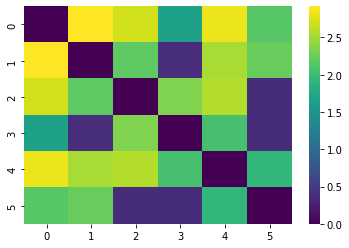

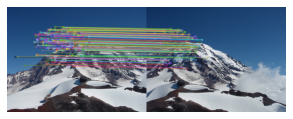

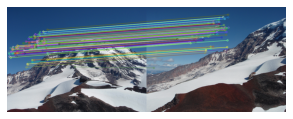

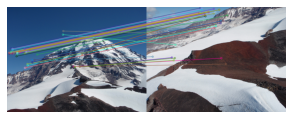

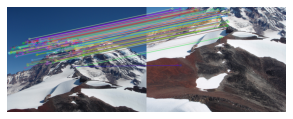

...

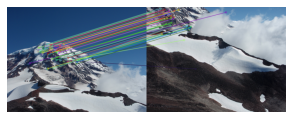

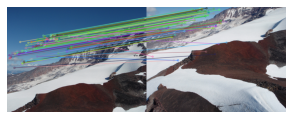

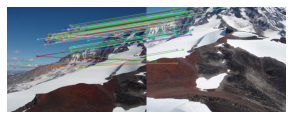

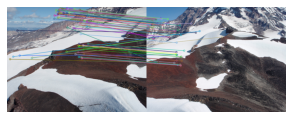

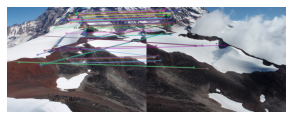

In [51]:
matches_by_group = []
# find matches again by different groups
for imgs, features in zip(imgs_by_group, features_by_group):
    mc = Matcher()
    mc.construct()                                                       # construct a feature matcher
    matches = mc.match_features(features=features)                       # match the features
    matches_by_group.append(matches)
    print('[INFO] number of matches found is {}'.format(len(matches)))   # since we have n images, the result has n**2 matches

    cf_matrix = mc.get_confidence_matrix(matches=matches)                # get the confidence matrix
    mc.get_confidence_heatmap(matches=matches)
    mc.get_match_info(imgs, features=features, matches=matches)

    mc.describe(ih, imgs, features=features, matches=matches)

In [52]:
low_imgs_by_group = []
med_imgs_by_group = []
final_imgs_by_group = []
low_sizes_by_group = []
med_sizes_by_group = []
final_sizes_by_group = []

for imgs in imgs_by_group:
    low_imgs, med_imgs, final_imgs = rz.get_resized_imgs(imgs)
    low_sizes = ih.get_sizes(low_imgs)
    med_sizes = ih.get_sizes(med_imgs)
    final_sizes = ih.get_sizes(final_imgs)
    low_imgs_by_group.append(low_imgs); med_imgs_by_group.append(med_imgs); final_imgs_by_group.append(final_imgs)
    low_sizes_by_group.append(low_sizes); med_sizes_by_group.append(med_sizes); final_sizes_by_group.append(final_sizes)

for matches in matches_by_group:
    print('confidence matrix without noise >>> \n{}'.format(mc.get_confidence_matrix(matches)))

confidence matrix without noise >>> 
[[0.         2.13270142 2.39401496 0.3960396  0.         0.40816327]
 [2.13270142 0.         0.         1.56756757 0.         0.38461538]
 [2.39401496 0.         0.         0.36363636 2.37012987 0.37383178]
 [0.3960396  1.56756757 0.36363636 0.         0.         2.52747253]
 [0.         0.         2.37012987 0.         0.         0.        ]
 [0.40816327 0.38461538 0.37383178 2.52747253 0.         0.        ]]
confidence matrix without noise >>> 
[[0.         2.91721419 2.7032967  1.67420814 2.83604136 2.14545455]
 [2.91721419 0.         2.19512195 0.37383178 2.53283302 2.24080268]
 [2.7032967  2.19512195 0.         2.35148515 2.5862069  0.3539823 ]
 [1.67420814 0.37383178 2.35148515 0.         2.05787781 0.36363636]
 [2.83604136 2.53283302 2.5862069  2.05787781 0.         1.91637631]
 [2.14545455 2.24080268 0.3539823  0.36363636 1.91637631 0.        ]]


In [53]:
class cameraEstimator:

    def __init__(self):
        self.estimator = None

    def construct_camera_estimator(self, **kwargs):
        # the default is the homography estimator
        self.estimator = cv2.detail_HomographyBasedEstimator(**kwargs)

    def estimate(self, features, matches):
        '''
        input: estimator, features, matches
        output: a list of matrices
        '''
        # estimate the homography matrix
        flag, cameras = self.estimator.apply(features, matches, None)
        if not flag: # estimation of homography matrix failed
            print('[INFO] Homography estimation failed')
        for cam in cameras:
            cam.R = cam.R.astype(np.float32)
        return cameras

In [54]:
class cameraAdjustor:

    DEFAULT_REFINEMENT_MASK = "xxxxx"

    def __init__(self):
        self.adjuster = None

    def construct_camera_adjuster(self):
        # the default is the ray adjuster
        self.adjuster = cv2.detail.BundleAdjusterRay()

    def set_refinement_mask(self, refinement_mask = DEFAULT_REFINEMENT_MASK):
        mask_matrix = np.zeros((3, 3), np.uint8)
        if refinement_mask[0] == "x":
            mask_matrix[0, 0] = 1
        if refinement_mask[1] == "x":
            mask_matrix[0, 1] = 1
        if refinement_mask[2] == "x":
            mask_matrix[0, 2] = 1
        if refinement_mask[3] == "x":
            mask_matrix[1, 1] = 1
        if refinement_mask[4] == "x":
            mask_matrix[1, 2] = 1
        return mask_matrix

    def adjust(self, features, matches, estimated_cameras):
        flag, cameras = self.adjuster.apply(features, matches, estimated_cameras)
        if not flag: # camera adjusting failed
            print('[INFO] Camera parameters adjusting failed')
        return cameras

In [55]:
class waveCorrector:
    
    def __init__(self):
        pass

    # the default corrector is HORIZ
    def wave_correct(self, cameras, wave_correct_kind = cv2.detail.WAVE_CORRECT_HORIZ):
        if wave_correct_kind is not None:
            rmats = [np.copy(cam.R) for cam in cameras]
            rmats = cv2.detail.waveCorrect(rmats, wave_correct_kind)
            for idx, cam in enumerate(cameras):
                cam.R = rmats[idx]
            return cameras
        return cameras

In [56]:
ce = cameraEstimator()
ca = cameraAdjustor()
wc = waveCorrector()

ce.construct_camera_estimator()
ca.construct_camera_adjuster()

cameras_by_group = []
for features, matches in zip(features_by_group, matches_by_group):
    cameras = ce.estimate(features=features, matches=matches)
    #print(cameras[0].R)
    cameras = ca.adjust(estimated_cameras=cameras, features=features, matches=matches)
    #print(cameras[0].R)
    cameras = wc.wave_correct(cameras=cameras)
    #print(cameras[0].R)
    cameras_by_group.append(cameras)

In [58]:
# use spherical warpping
class Wrapper:

    def __init__(self):
        pass

    def set_scale(self, cameras):
        focals = [cam.focal for cam in cameras]
        scale = np.median(focals)               # get the median of the focal length
        return scale

    def warp_images(self, scale, imgs, cameras, aspect=1, warper_type = DEFAULTE_WARPER_TYPE):
        for img, camera in zip(imgs, cameras):
            yield self.warp_image(scale, img, camera, aspect, warper_type)

    def warp_image(self, scale, img, camera, aspect=1, warper_type=DEFAULTE_WARPER_TYPE):
        warper = cv2.PyRotationWarper(warper_type, scale * aspect)
        _, warped_image = warper.warp(img,self.get_K(camera, aspect),camera.R,cv2.INTER_LINEAR,cv2.BORDER_REFLECT)
        return warped_image

    def get_K(self, camera, aspect=1):
        K = camera.K().astype(np.float32)
        """ Modification of intrinsic parameters needed if cameras were
        obtained on different scale than the scale of the Images which should
        be warped """
        K[0, 0] *= aspect
        K[0, 2] *= aspect
        K[1, 1] *= aspect
        K[1, 2] *= aspect
        return K

    def create_and_warp_masks(self, scale, sizes, cameras, aspect=1, wraper_type=DEFAULTE_WARPER_TYPE):
        for size, camera in zip(sizes, cameras):
            yield self.create_and_warp_mask(scale, size, camera, aspect, wraper_type)

    def create_and_warp_mask(self, scale, size, camera, aspect=1, warper_type=DEFAULTE_WARPER_TYPE):
            warper = cv2.PyRotationWarper(warper_type, scale * aspect)
            mask = 255 * np.ones((size[1], size[0]), np.uint8)
            _, warped_mask = warper.warp(
                mask,
                self.get_K(camera, aspect),
                camera.R,
                cv2.INTER_NEAREST,
                cv2.BORDER_CONSTANT,
            )
            return warped_mask

    def warp_rois(self, scale, sizes, cameras, aspect=1, warper_type = DEFAULTE_WARPER_TYPE):
        roi_corners = []
        roi_sizes = []
        for size, camera in zip(sizes, cameras):
            roi = self.warp_roi(scale, size, camera, aspect, DEFAULTE_WARPER_TYPE)
            roi_corners.append(roi[0:2])
            roi_sizes.append(roi[2:4])
        return roi_corners, roi_sizes

    def warp_roi(self, scale, size, camera, aspect=1, warper_type=DEFAULTE_WARPER_TYPE):
        warper = cv2.PyRotationWarper(warper_type, scale * aspect)
        K = self.get_K(camera, aspect)
        return warper.warpRoi(size, K, camera.R)

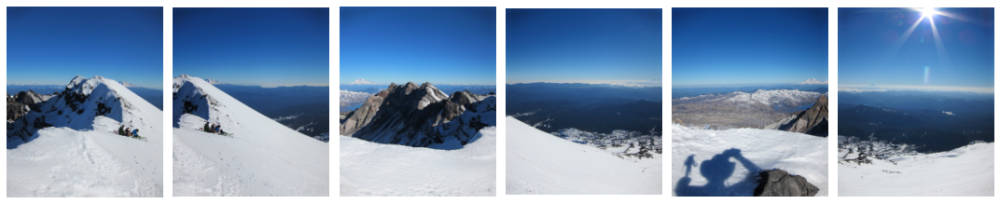

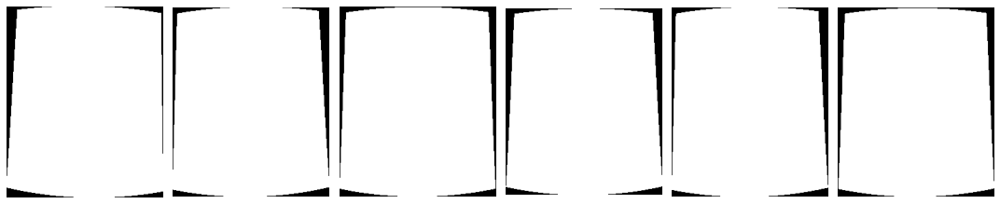

[(-599, 1044), (-195, 1050), (-1124, 1044), (304, 1073), (-1737, 1044), (898, 1052)]
[(800, 977), (817, 988), (802, 976), (822, 979), (807, 981), (805, 975)]


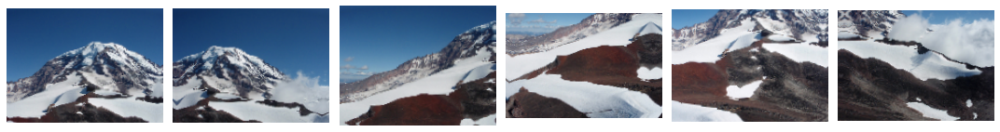

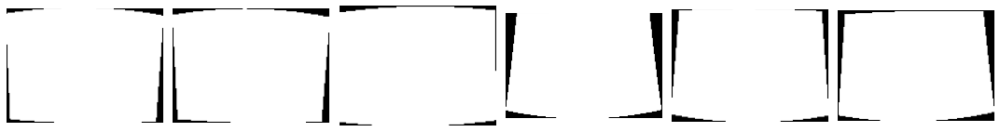

[(-236, 650), (-87, 638), (-465, 732), (-547, 890), (-270, 831), (61, 844)]
[(510, 375), (516, 376), (489, 374), (546, 372), (519, 374), (530, 378)]


In [59]:
wp = Wrapper()
info = []
info_high = []
for i in range(len(cameras_by_group)):
    
    tmp1 = []
    tmp2 = []

    scale = wp.set_scale(cameras=cameras_by_group[i])
    camera_aspect = DEFAULT_LOW_MEGAPIX / DEFAULT_MEDIUM_MEGAPIX

    warped_low_imgs = list(wp.warp_images(scale, low_imgs_by_group[i], cameras_by_group[i], camera_aspect))
    warped_low_masks = list(wp.create_and_warp_masks(scale, low_sizes_by_group[i], cameras_by_group[i], camera_aspect))
    low_corners, low_sizes = wp.warp_rois(scale, low_sizes_by_group[i], cameras_by_group[i], camera_aspect)
    tmp1.append((warped_low_imgs, warped_low_masks, low_corners, low_sizes))

    camera_aspect = DEFAULT_FINAL_MEGAPIX/DEFAULT_MEDIUM_MEGAPIX

    warped_final_imgs = list(wp.warp_images(scale, final_imgs_by_group[i], cameras_by_group[i], camera_aspect))
    warped_final_masks = list(wp.create_and_warp_masks(scale, final_sizes_by_group[i], cameras_by_group[i], camera_aspect))
    final_corners, final_sizes = wp.warp_rois(scale, final_sizes_by_group[i], cameras_by_group[i], camera_aspect)
    #print(final_corners)
    tmp2.append((warped_final_imgs, warped_final_masks, final_corners, final_sizes))

    ih.plot_images(warped_low_imgs, (15,15))
    ih.plot_images(warped_low_masks, (15,15))

    info.append(tmp1)
    info_high.append(tmp2)

    print(final_corners)
    print(final_sizes)

In [60]:
from collections import namedtuple

class Rectangle(namedtuple("Rectangle", "x y width height")):
    __slots__ = ()

    @property
    def area(self):
        return self.width * self.height

    @property
    def corner(self):
        return (self.x, self.y)

    @property
    def size(self):
        return (self.width, self.height)

    @property
    def x2(self):
        return self.x + self.width

    @property
    def y2(self):
        return self.y + self.height

    def times(self, x):
        return Rectangle(*(int(round(i * x)) for i in self))

    def draw_on(self, img, color=(255, 0, 0), size=0.5):
        if len(img.shape) == 2:
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        start_point = (self.x, self.y)
        end_point = (self.x2 - 1, self.y2 - 1)
        cv2.rectangle(img, start_point, end_point, color, size)
        return img


class Cropper:

    DEFAULT_CROP = True

    def __init__(self, crop=DEFAULT_CROP):
        self.do_crop = crop
        self.overlapping_rectangles = []
        self.cropping_rectangles = []

    def prepare(self, imgs, masks, corners, sizes):
        if self.do_crop:
            mask = self.estimate_panorama_mask(imgs, masks, corners, sizes)
            lir = self.estimate_largest_interior_rectangle(mask)
            corners = self.get_zero_center_corners(corners)
            rectangles = self.get_rectangles(corners, sizes)
            self.overlapping_rectangles = self.get_overlaps(rectangles, lir)
            self.intersection_rectangles = self.get_intersections(
                rectangles, self.overlapping_rectangles
            )

    def crop_images(self, imgs, aspect=1):
        for idx, img in enumerate(imgs):
            yield self.crop_img(img, idx, aspect)

    def crop_img(self, img, idx, aspect=1):
        if self.do_crop:
            intersection_rect = self.intersection_rectangles[idx]
            scaled_intersection_rect = intersection_rect.times(aspect)
            cropped_img = self.crop_rectangle(img, scaled_intersection_rect)
            return cropped_img
        return img

    def crop_rois(self, corners, sizes, aspect=1):
        if self.do_crop:
            scaled_overlaps = [r.times(aspect) for r in self.overlapping_rectangles]
            cropped_corners = [r.corner for r in scaled_overlaps]
            cropped_corners = self.get_zero_center_corners(cropped_corners)
            cropped_sizes = [r.size for r in scaled_overlaps]
            return cropped_corners, cropped_sizes
        return corners, sizes

    @staticmethod
    def estimate_panorama_mask(imgs, masks, corners, sizes):
        _, mask = Blender.create_panorama(imgs, masks, corners, sizes)
        return mask

    def estimate_largest_interior_rectangle(self, mask):
        # largestinteriorrectangle is only imported if cropping
        # is explicitely desired (needs some time to compile at the first run!)
        import largestinteriorrectangle

        contours, hierarchy = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
        if not hierarchy.shape == (1, 1, 4) or not np.all(hierarchy == -1):
            print('[INFO] Invalid Contour. Try without cropping.')
        contour = contours[0][:, 0, :]

        lir = largestinteriorrectangle.lir(mask > 0, contour)
        lir = Rectangle(*lir)
        return lir

    @staticmethod
    def get_zero_center_corners(corners):
        min_corner_x = min([corner[0] for corner in corners])
        min_corner_y = min([corner[1] for corner in corners])
        return [(x - min_corner_x, y - min_corner_y) for x, y in corners]

    @staticmethod
    def get_rectangles(corners, sizes):
        rectangles = []
        for corner, size in zip(corners, sizes):
            rectangle = Rectangle(*corner, *size)
            rectangles.append(rectangle)
        return rectangles

    @staticmethod
    def get_overlaps(rectangles, lir):
        return [Cropper.get_overlap(r, lir) for r in rectangles]

    @staticmethod
    def get_overlap(rectangle1, rectangle2):
        x1 = max(rectangle1.x, rectangle2.x)
        y1 = max(rectangle1.y, rectangle2.y)
        x2 = min(rectangle1.x2, rectangle2.x2)
        y2 = min(rectangle1.y2, rectangle2.y2)
        if x2 < x1 or y2 < y1:
            print('[INFO] Rectangles do not overlap!')
        return Rectangle(x1, y1, x2 - x1, y2 - y1)

    @staticmethod
    def get_intersections(rectangles, overlapping_rectangles):
        return [
            Cropper.get_intersection(r, overlap_r)
            for r, overlap_r in zip(rectangles, overlapping_rectangles)
        ]

    @staticmethod
    def get_intersection(rectangle, overlapping_rectangle):
        x = abs(overlapping_rectangle.x - rectangle.x)
        y = abs(overlapping_rectangle.y - rectangle.y)
        width = overlapping_rectangle.width
        height = overlapping_rectangle.height
        return Rectangle(x, y, width, height)

    @staticmethod
    def crop_rectangle(img, rectangle):
        return img[rectangle.y : rectangle.y2, rectangle.x : rectangle.x2]

In [62]:
class Blender:
    """https://docs.opencv.org/4.x/d6/d4a/classcv_1_1detail_1_1Blender.html"""

    BLENDER_CHOICES = (
        "multiband",
        "feather",
        "no",
    )

    def __init__(
        self, blender_type=DEFAULT_BLENDER, blend_strength=DEFAULT_BLEND_STRENGTH
    ):
        self.blender_type = blender_type
        self.blend_strength = blend_strength
        self.blender = None

    def prepare(self, corners, sizes):
        dst_sz = cv2.detail.resultRoi(corners=corners, sizes=sizes)
        print(dst_sz)
        blend_width = np.sqrt(dst_sz[2] * dst_sz[3]) * self.blend_strength / 100

        if self.blender_type == "no" or blend_width < 1:
            self.blender = cv2.detail.Blender_createDefault(cv2.detail.Blender_NO)

        elif self.blender_type == "multiband":
            self.blender = cv2.detail_MultiBandBlender()
            self.blender.setNumBands(int((np.log(blend_width) / np.log(2.0) - 1.0)))

        elif self.blender_type == "feather":
            self.blender = cv2.detail_FeatherBlender()
            self.blender.setSharpness(1.0 / blend_width)

        self.blender.prepare(dst_sz)

    def feed(self, img, mask, corner):
        self.blender.feed(cv2.UMat(img.astype(np.int16)), mask, corner)

    def blend(self):
        result = None
        result_mask = None
        result, result_mask = self.blender.blend(result, result_mask)
        result = cv2.convertScaleAbs(result)
        return result, result_mask

    @classmethod
    def create_panorama(cls, imgs, masks, corners, sizes):
        blender = cls("no")
        blender.prepare(corners, sizes)
        for img, mask, corner in zip(imgs, masks, corners):
            blender.feed(img, mask, corner)
        return blender.blend()

(-521, 313, 1032, 302)


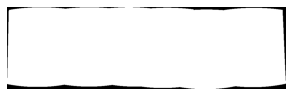

Rectangle(x=7, y=12, width=1013, height=273)


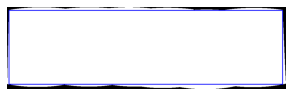

(-164, 191, 341, 187)


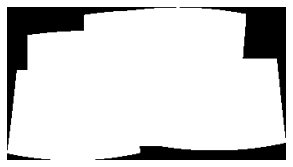

Rectangle(x=25, y=34, width=263, height=136)


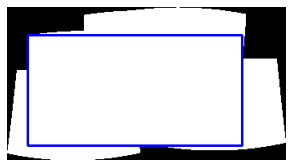

In [63]:
cropper = Cropper()
plots_by_group = []
lirs = []

for i in info:
    for j in range(len(i)):
        mask = cropper.estimate_panorama_mask(i[j][0], i[j][1], i[j][2], i[j][3])
        ih.plot_image(mask, (5,5))

        lir = cropper.estimate_largest_interior_rectangle(mask)
        lirs.append(lir)
        print(lir)
        plot = lir.draw_on(mask, size=2)

        plots_by_group.append(plot)
        ih.plot_image(plot, (5,5))

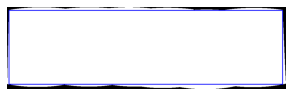

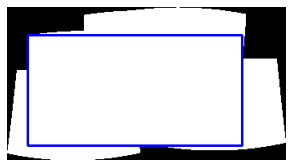

In [64]:
recs_by_group = []
count = 0
for i in info:
    tmp = []
    for j in range(len(i)):
        low_corners = cropper.get_zero_center_corners(i[j][2])
        rectangles = cropper.get_rectangles(i[j][2], i[j][3])
        tmp.append(rectangles)

        plots_by_group[count] = rectangles[0].draw_on(plots_by_group[count], (255, 0, 0), 1)  # The rectangle of the center img
        ih.plot_image(plots_by_group[count], (5,5))

        count+=1

    recs_by_group.append(tmp)

In [65]:
info_ = []
info_high_ = []

lir_aspect = DEFAULT_FINAL_MEGAPIX/DEFAULT_LOW_MEGAPIX  # since lir was obtained on low imgs
for i in range(len(info)):
    tmp1 = []; tmp2 = []
    for j in range(len(info[i])):
        cropper.prepare(info[i][j][0], info[i][j][1], info[i][j][2], info[i][j][3])
        cropped_low_masks = list(cropper.crop_images(info[i][j][1]))
        cropped_low_imgs = list(cropper.crop_images(info[i][j][0]))
        low_corners, low_sizes = cropper.crop_rois(info[i][j][2], info[i][j][3])
        tmp1.append((cropped_low_masks, cropped_low_imgs, low_corners, low_sizes))
        info_.append(tmp1)
        
        cropped_final_masks = list(cropper.crop_images(info_high[i][j][1], lir_aspect))
        cropped_final_imgs = list(cropper.crop_images(info_high[i][j][0], lir_aspect))
        final_corners, final_sizes = cropper.crop_rois(info_high[i][j][2], info_high[i][j][3], lir_aspect)
        
        tmp2.append((cropped_final_masks, cropped_final_imgs, final_corners, final_sizes))
        info_high_.append(tmp2)

(-521, 313, 1032, 302)
(-164, 191, 341, 187)


In [67]:
class SeamFinder:
    """https://docs.opencv.org/4.x/d7/d09/classcv_1_1detail_1_1SeamFinder.html"""

    SEAM_FINDER_CHOICES = OrderedDict()
    SEAM_FINDER_CHOICES["dp_color"] = cv2.detail_DpSeamFinder("COLOR")
    SEAM_FINDER_CHOICES["dp_colorgrad"] = cv2.detail_DpSeamFinder("COLOR_GRAD")
    SEAM_FINDER_CHOICES["voronoi"] = cv2.detail.SeamFinder_createDefault(
        cv2.detail.SeamFinder_VORONOI_SEAM
    )  # noqa
    SEAM_FINDER_CHOICES["no"] = cv2.detail.SeamFinder_createDefault(
        cv2.detail.SeamFinder_NO
    )  # noqa

    DEFAULT_SEAM_FINDER = list(SEAM_FINDER_CHOICES.keys())[DEFAULT_SEAM_FINDER_IDX]

    def __init__(self, finder=DEFAULT_SEAM_FINDER):
        self.finder = SeamFinder.SEAM_FINDER_CHOICES[finder]

    def find(self, imgs, corners, masks):
        imgs_float = [img.astype(np.float32) for img in imgs]
        return self.finder.find(imgs_float, corners, masks)

    @staticmethod
    def resize(seam_mask, mask):
        dilated_mask = cv2.dilate(seam_mask, None)
        resized_seam_mask = cv2.resize(
            dilated_mask, (mask.shape[1], mask.shape[0]), 0, 0, cv2.INTER_LINEAR_EXACT
        )
        return cv2.bitwise_and(resized_seam_mask, mask)

    @staticmethod
    def draw_seam_mask(img, seam_mask, color=(0, 0, 0)):
        seam_mask = cv2.UMat.get(seam_mask)
        overlayed_img = np.copy(img)
        overlayed_img[(seam_mask == 0)] = color
        return overlayed_img

    @staticmethod
    def draw_seam_polygons(panorama, blended_seam_masks, alpha=0.5):
        return add_weighted_image(panorama, blended_seam_masks, alpha)

    @staticmethod
    def draw_seam_lines(panorama, blended_seam_masks, linesize=1, color=(0, 0, 255)):
        seam_lines = SeamFinder.exctract_seam_lines(blended_seam_masks, linesize)
        panorama_with_seam_lines = panorama.copy()
        panorama_with_seam_lines[seam_lines == 255] = color
        return panorama_with_seam_lines

    @staticmethod
    def exctract_seam_lines(blended_seam_masks, linesize=1):
        seam_lines = cv2.Canny(np.uint8(blended_seam_masks), 100, 200)
        seam_indices = (seam_lines == 255).nonzero()
        seam_lines = remove_invalid_line_pixels(
            seam_indices, seam_lines, blended_seam_masks
        )
        kernelsize = linesize + linesize - 1
        kernel = np.ones((kernelsize, kernelsize), np.uint8)
        return cv2.dilate(seam_lines, kernel)

    @staticmethod
    def blend_seam_masks(seam_masks, corners, sizes):
        imgs = colored_img_generator(sizes)
        blended_seam_masks, _ = Blender.create_panorama(
            imgs, seam_masks, corners, sizes
        )
        return blended_seam_masks


def colored_img_generator(
    sizes,
    colors=(
        (255, 000, 000),  # Blue
        (000, 000, 255),  # Red
        (000, 255, 000),  # Green
        (000, 255, 255),  # Yellow
        (255, 000, 255),  # Magenta
        (128, 128, 255),  # Pink
        (128, 128, 128),  # Gray
        (000, 000, 128),  # Brown
        (000, 128, 255),
    ),  # Orange
):
    for idx, size in enumerate(sizes):
        if idx + 1 > len(colors):
            raise ValueError(
                "Not enough default colors! Pass additional "
                'colors to "colors" parameter'
            )
        yield create_img_by_size(size, colors[idx])


def create_img_by_size(size, color=(0, 0, 0)):
    width, height = size
    img = np.zeros((height, width, 3), np.uint8)
    img[:] = color
    return img


def add_weighted_image(img1, img2, alpha):
    return cv2.addWeighted(img1, alpha, img2, (1.0 - alpha), 0.0)


def remove_invalid_line_pixels(indices, lines, mask):
    for x, y in zip(*indices):
        if check_if_pixel_or_neighbor_is_black(mask, x, y):
            lines[x, y] = 0
    return lines


def check_if_pixel_or_neighbor_is_black(img, x, y):
    check = [
        is_pixel_black(img, x, y),
        is_pixel_black(img, x + 1, y),
        is_pixel_black(img, x - 1, y),
        is_pixel_black(img, x, y + 1),
        is_pixel_black(img, x, y - 1),
    ]
    return any(check)


def is_pixel_black(img, x, y):
    return np.all(get_pixel_value(img, x, y) == 0)


def get_pixel_value(img, x, y):
    try:
        return img[x, y]
    except IndexError:
        pass

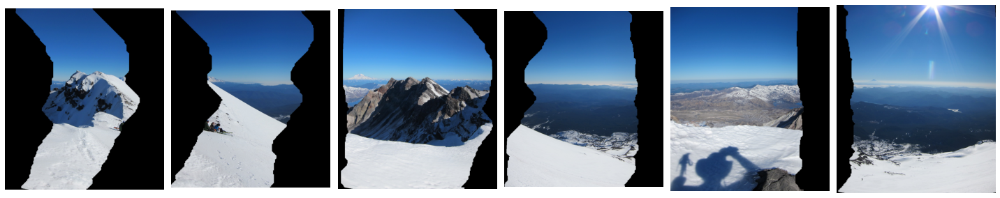

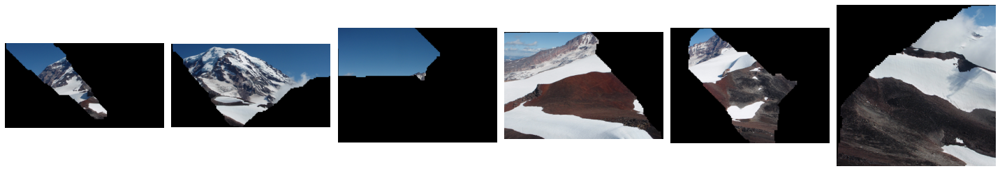

In [68]:
seam_finder = SeamFinder()
seam_masks_by_group = []

for i in range(len(info_)):
    for j in range(len(info_[i])):
        seam_masks = seam_finder.find(info_[i][j][1], info_[i][j][2], info_[i][j][0])
        seam_masks = [seam_finder.resize(seam_mask, mask) for seam_mask, mask in zip(seam_masks, info_high_[i][j][0])]

        seam_masks_by_group.append(seam_masks)

        seam_masks_plots = [SeamFinder.draw_seam_mask(img, seam_mask) for img, seam_mask in zip(info_high_[i][j][1], seam_masks)]
        ih.plot_images(seam_masks_plots, (20,20))

In [30]:
class ExposureErrorCompensator:
    """https://docs.opencv.org/4.x/d2/d37/classcv_1_1detail_1_1ExposureCompensator.html"""  # noqa: E501

    COMPENSATOR_CHOICES = OrderedDict()
    COMPENSATOR_CHOICES["gain_blocks"] = cv2.detail.ExposureCompensator_GAIN_BLOCKS
    COMPENSATOR_CHOICES["gain"] = cv2.detail.ExposureCompensator_GAIN
    COMPENSATOR_CHOICES["channel"] = cv2.detail.ExposureCompensator_CHANNELS
    COMPENSATOR_CHOICES[
        "channel_blocks"
    ] = cv2.detail.ExposureCompensator_CHANNELS_BLOCKS
    COMPENSATOR_CHOICES["no"] = cv2.detail.ExposureCompensator_NO

    DEFAULT_COMPENSATOR = list(COMPENSATOR_CHOICES.keys())[DEFAULT_COMPENSATOR_IDX]

    def __init__(
        self,
        compensator=DEFAULT_COMPENSATOR,
        nr_feeds=DEFAULT_NR_FEEDS,
        block_size=DEFAULT_BLOCK_SIZE,
    ):

        if compensator == "channel":
            self.compensator = cv2.detail_ChannelsCompensator(nr_feeds)
        elif compensator == "channel_blocks":
            self.compensator = cv2.detail_BlocksChannelsCompensator(
                block_size, block_size, nr_feeds
            )
        else:
            self.compensator = cv2.detail.ExposureCompensator_createDefault(
                ExposureErrorCompensator.COMPENSATOR_CHOICES[compensator]
            )

    def feed(self, *args):
        """https://docs.opencv.org/4.x/d2/d37/classcv_1_1detail_1_1ExposureCompensator.html#ae6b0cc69a7bc53818ddea53eddb6bdba"""  # noqa
        self.compensator.feed(*args)

    def apply(self, *args):
        """https://docs.opencv.org/4.x/d2/d37/l.html#a473eaf1e585804c08d77c91e004f93aa"""  # noqa
        return self.compensator.apply(*args)

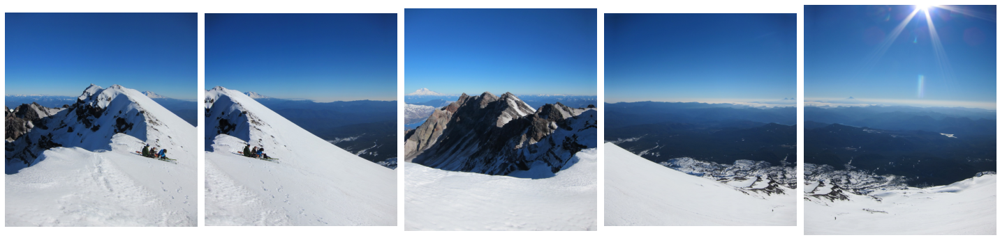

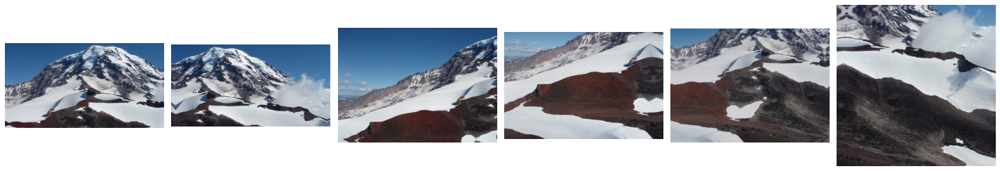

In [31]:
compensator = ExposureErrorCompensator()
compensated_imgs_by_group = []

for i in range(len(info_)):
    for j in range(len(info_[i])):
        compensator.feed(info_[i][j][2], info_[i][j][1], info_[i][j][0])

        compensated_imgs = [compensator.apply(idx, corner, img, mask) 
                            for idx, (img, mask, corner) 
                            in enumerate(zip(info_high_[i][j][1], info_high_[i][j][0], info_high_[i][j][2]))]
        compensated_imgs_by_group.append(compensated_imgs)
        ih.plot_images(compensated_imgs,(20,20))

In [32]:
cv2.ocl.setUseOpenCL(False)

blender = Blender()
panoramas = []

for i in range(len(info_)):
    for j in range(len(info_[i])):
        blender.prepare(info_high_[i][j][2], info_high_[i][j][3])
        for img, mask, corner in zip(compensated_imgs_by_group[i], seam_masks_by_group[i], info_high_[i][j][2]):
            blender.feed(img, mask, corner)
        panorama, _ = blender.blend()
        panoramas.append(panorama)

(0, 0, 2730, 903)
(0, 0, 877, 450)


[INFO] Found 2 panoramas


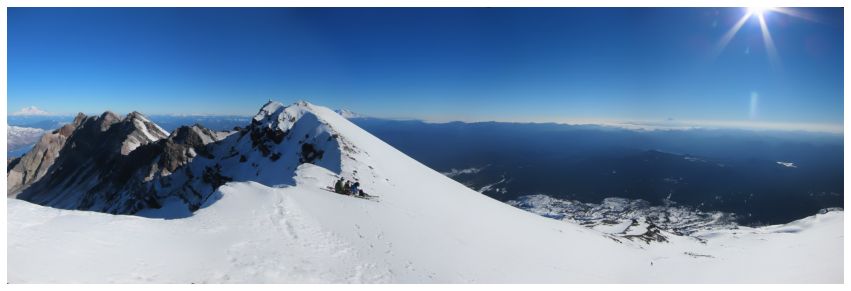

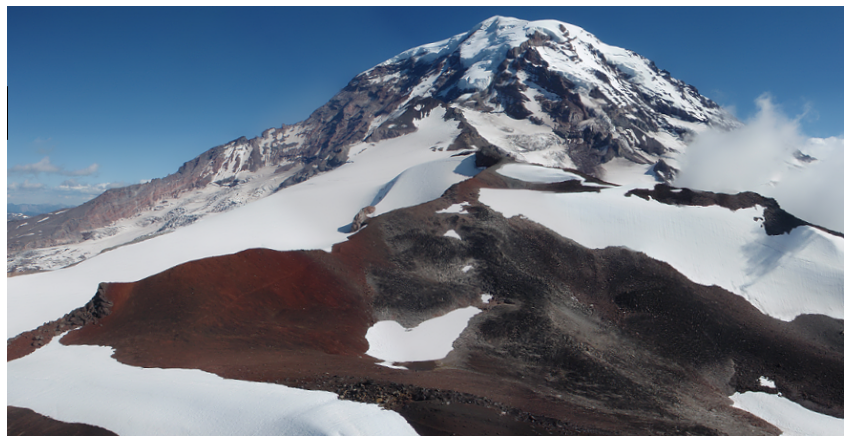

In [33]:
print('[INFO] Found {} panoramas'.format(len(panoramas)))
for panorama in panoramas:
    ih.plot_image(panorama, (15,15))

(0, 0, 2730, 903)


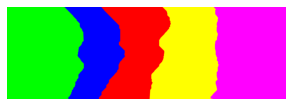

(0, 0, 877, 450)


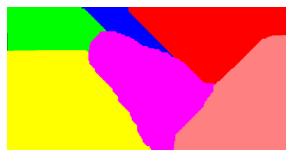

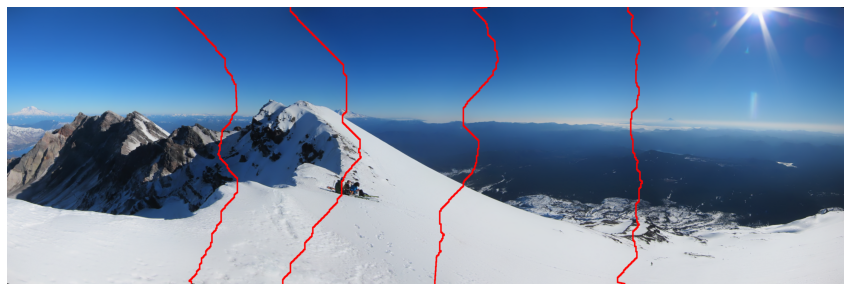

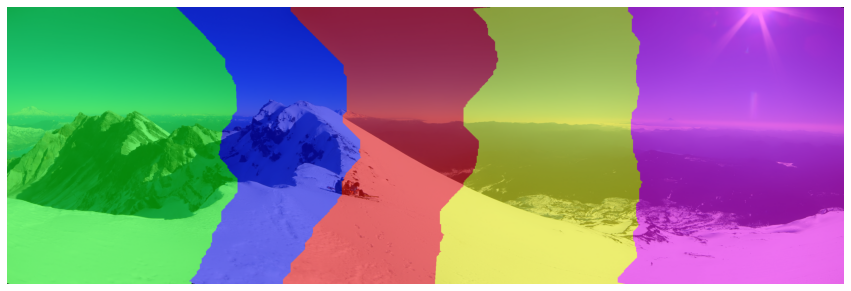

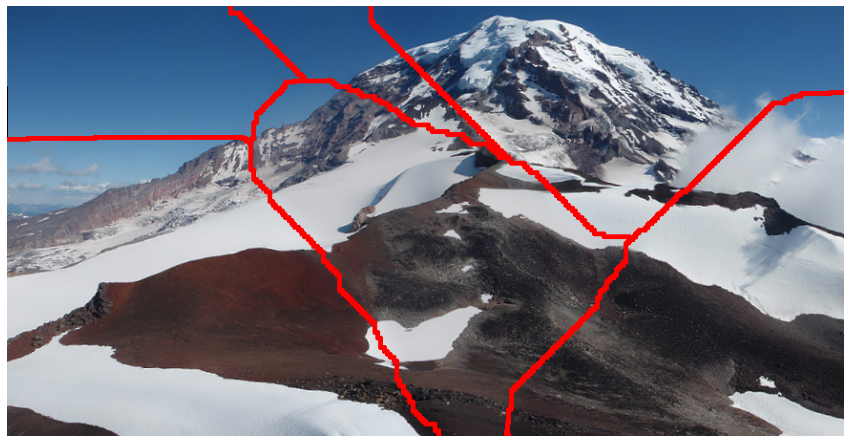

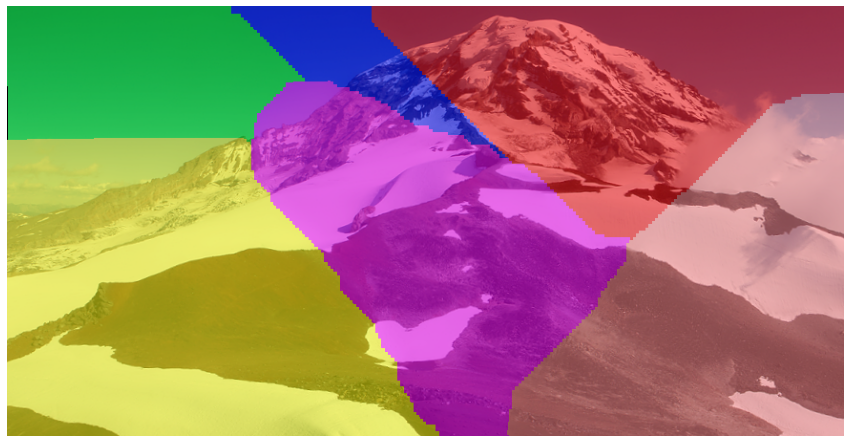

In [34]:
blended_seam_masks_group = []
for i in range(len(info_)):
    for j in range(len(info_[i])):
        blended_seam_masks = seam_finder.blend_seam_masks(seam_masks_by_group[i], info_high_[i][j][2], info_high_[i][j][3])
        blended_seam_masks_group.append(blended_seam_masks)
        ih.plot_image(blended_seam_masks, (5,5))
        
for i in range(len(panoramas)):
    ih.plot_image(seam_finder.draw_seam_lines(panoramas[i], blended_seam_masks_group[i], linesize=3), (15,10))
    ih.plot_image(seam_finder.draw_seam_polygons(panoramas[i], blended_seam_masks_group[i]), (15,10))